In [30]:
!pip uninstall opencv-python -y

Found existing installation: opencv-python 4.10.0.82
Uninstalling opencv-python-4.10.0.82:
  Successfully uninstalled opencv-python-4.10.0.82


You can safely remove it manually.


In [4]:
!pip uninstall opencv-python-headless -y 

!pip install opencv-python --upgrade

Found existing installation: opencv-python-headless 4.10.0.84
Uninstalling opencv-python-headless-4.10.0.84:
  Successfully uninstalled opencv-python-headless-4.10.0.84


You can safely remove it manually.


In [5]:
import pandas as pd
import numpy as np
import cv2
import os
import ast

def via_csv_to_mask(via_csv, image_dir, output_dir):
    annotations = pd.read_csv(via_csv)

    for index, row in annotations.iterrows():
        filename = row['filename']
        img_path = os.path.join(image_dir, filename)
        img = cv2.imread(img_path)
        if img is None:
            continue

        height, width = img.shape[:2]
        mask = np.zeros((height, width), dtype=np.uint8)
        
        shape_attr = ast.literal_eval(row['region_shape_attributes'])
        if shape_attr['name'] == 'polyline':
            all_points_x = shape_attr['all_points_x']
            all_points_y = shape_attr['all_points_y']
            points = np.array([list(zip(all_points_x, all_points_y))], dtype=np.int32)
            cv2.fillPoly(mask, points, 255)

        mask_file = os.path.join(output_dir, filename.replace('.jpg', '_mask.png'))
        cv2.imwrite(mask_file, mask)

# Usage example
via_csv = 'via_project_18Jun2024_14h5m_csv.csv'  # Path to your VIA CSV file
image_dir = 'train_images'             # Directory containing your images
output_dir = 'masks'        # Directory to save the generated masks
os.makedirs(output_dir, exist_ok=True)

via_csv_to_mask(via_csv, image_dir, output_dir)


In [ ]:
pip uninstall opencv-python opencv-python-headless
pip install opencv-python

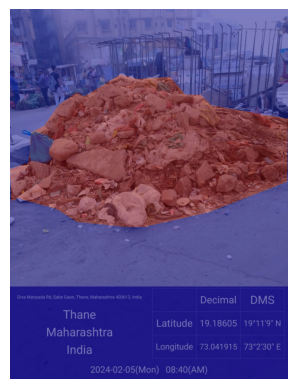

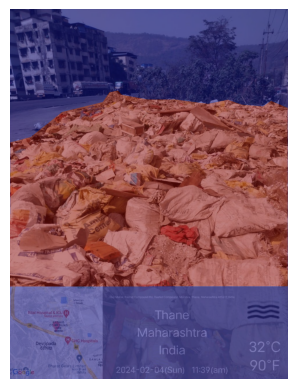

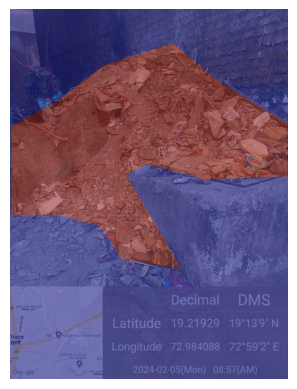

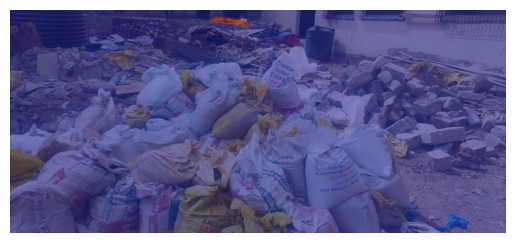

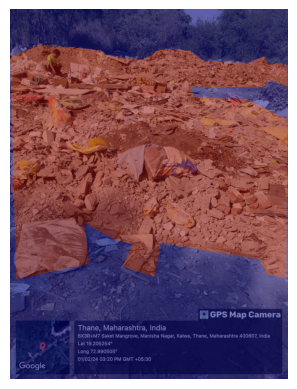

...

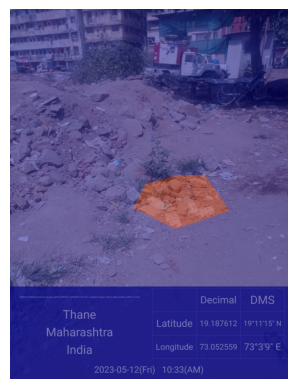

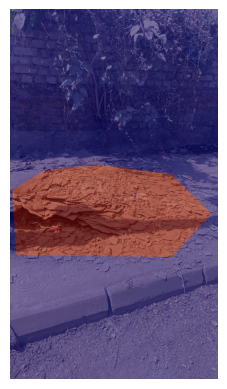

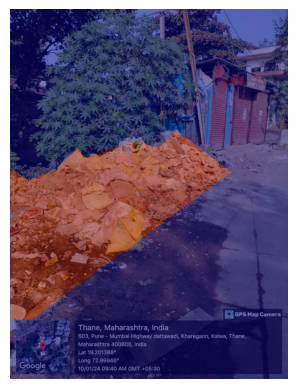

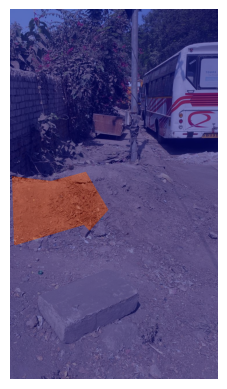

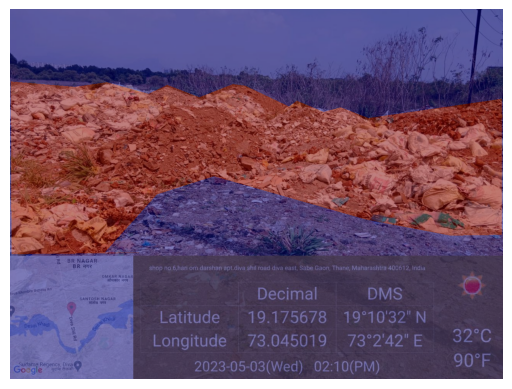

In [16]:
import os
import matplotlib.pyplot as plt
def overlay_mask_on_image(image, mask, alpha=0.5):
    """Overlay mask on the image with transparency."""
    color_mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(image, alpha, color_mask, 1 - alpha, 0)
    return overlayed_image

# Verify masks
mask_dir = output_dir  # Directory where masks were saved

for filename in os.listdir(image_dir):
    img_path = os.path.join(image_dir, filename)
    mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))
    
    if os.path.exists(mask_path):
        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        overlayed_image = overlay_mask_on_image(image, mask)
        
        # Display the overlayed image
        # Display the image using matplotlib
        plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Hide the axis
        plt.show()
        # cv2.imshow('Overlayed Image', overlayed_image)
        # cv2.waitKey(0)
        # cv2.destroyAllWindows()
        
        # Optionally save the overlayed image
        overlayed_image_path = os.path.join('path_to_save_overlayed_images', filename.replace('.jpg', '_overlayed.png'))
        os.makedirs('path_to_save_overlayed_images', exist_ok=True)
        cv2.imwrite(overlayed_image_path, overlayed_image)


# combined Masks

In [17]:
import pandas as pd
import numpy as np
import cv2
import os
import ast

def via_csv_to_combined_mask(via_csv, image_dir, output_dir):
    annotations = pd.read_csv(via_csv)
    
    images_masks = {}

    for index, row in annotations.iterrows():
        filename = row['filename']
        img_path = os.path.join(image_dir, filename)
        img = cv2.imread(img_path)
        if img is None:
            continue

        height, width = img.shape[:2]
        
        if filename not in images_masks:
            images_masks[filename] = np.zeros((height, width), dtype=np.uint8)
        
        mask = images_masks[filename]
        
        shape_attr = ast.literal_eval(row['region_shape_attributes'])
        if shape_attr['name'] == 'polyline':
            all_points_x = shape_attr['all_points_x']
            all_points_y = shape_attr['all_points_y']
            points = np.array([list(zip(all_points_x, all_points_y))], dtype=np.int32)
            cv2.fillPoly(mask, points, 255)
    
    # Save combined masks
    for filename, mask in images_masks.items():
        mask_file = os.path.join(output_dir, filename.replace('.jpg', '_mask.png'))
        cv2.imwrite(mask_file, mask)

# Usage example
via_csv = 'via_project_18Jun2024_14h5m_csv.csv'  # Path to your VIA CSV file
image_dir = 'train_images'             # Directory containing your images
output_dir = 'masks'        # Directory to save the generated masks
os.makedirs(output_dir, exist_ok=True)

via_csv_to_combined_mask(via_csv, image_dir, output_dir)


### v1 overlay

In [18]:
import os
import cv2
def overlay_mask_on_image(image, mask, alpha=0.5):
    """Overlay mask on the image with transparency."""
    color_mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(image, alpha, color_mask, 1 - alpha, 0)
    return overlayed_image

# Verify masks
image_dir='train_images'
output_dir='masks'
# image_dir='augmented_train'
# output_dir='augmented_masks'
mask_dir = output_dir  # Directory where masks were saved

for filename in os.listdir(image_dir):
    img_path = os.path.join(image_dir, filename)
    mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))
    
    if os.path.exists(mask_path):
        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        overlayed_image = overlay_mask_on_image(image, mask)
        
        # Display the overlayed image
        resized_image = cv2.resize(overlayed_image,None,None,0.5,0.5)
        # cv2.imshow('Overlayed Image', resized_image)
        # cv2.waitKey(0)
        # cv2.destroyAllWindows()
        plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Hide the axis
        plt.show()
        # Optionally save the overlayed image
        overlayed_image_path = os.path.join('path_to_save_overlayed_images', filename.replace('.jpg', '_overlayed.png'))
        os.makedirs('path_to_save_overlayed_images', exist_ok=True)
        cv2.imwrite(overlayed_image_path, overlayed_image)


error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1301: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'


### v2

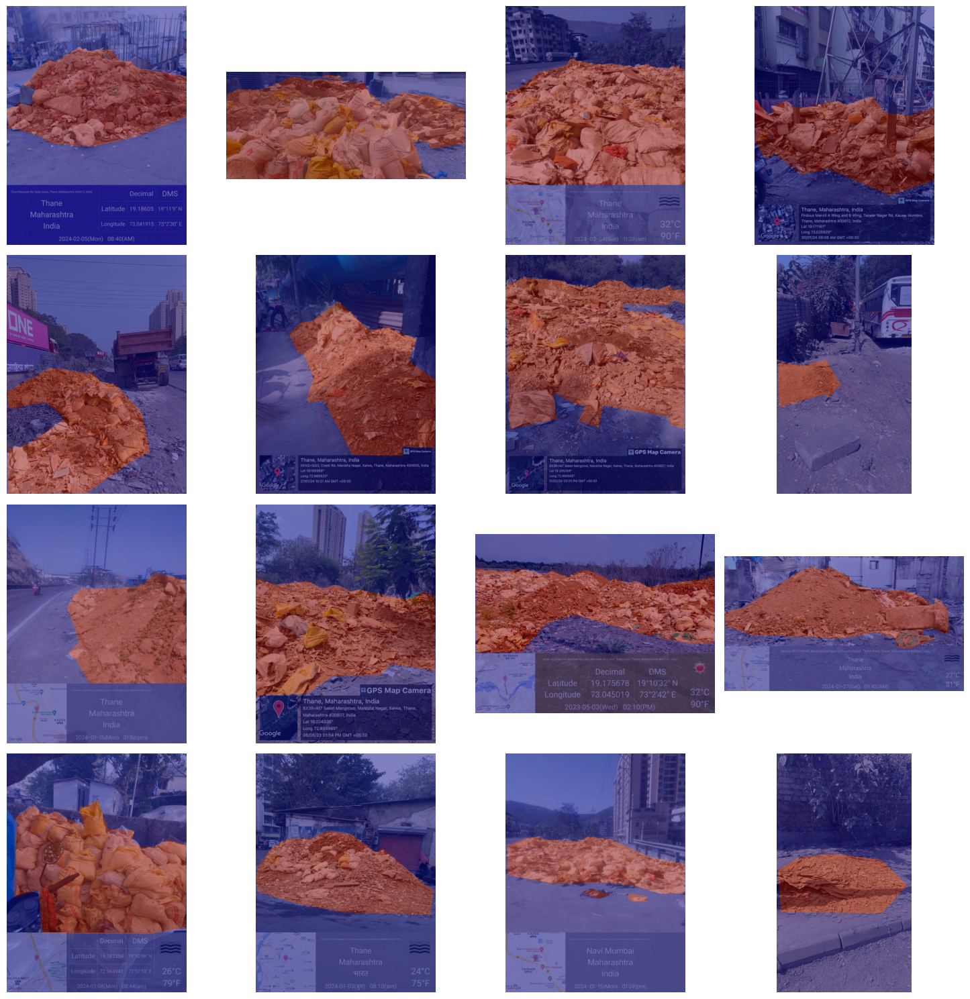

In [22]:
import os
import cv2
import random
import matplotlib.pyplot as plt

def overlay_mask_on_image(image, mask, alpha=0.5):
    """Overlay mask on the image with transparency."""
    color_mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(image, alpha, color_mask, 1 - alpha, 0)
    return overlayed_image

def display_images_in_grid(images, grid_size):
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(15, 15))
    
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            image = images[i]
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax.axis('off')  # Hide the axis
        else:
            ax.axis('off')  # Hide empty subplots

    plt.tight_layout()
    plt.show()

# Directories for images and masks
image_dir = 'train_images'
output_dir = 'masks'
mask_dir = output_dir  # Directory where masks were saved

# Accumulate overlayed images
overlayed_images = []

for filename in os.listdir(image_dir):
    img_path = os.path.join(image_dir, filename)
    mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))
    
    if os.path.exists(mask_path):
        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        overlayed_image = overlay_mask_on_image(image, mask)
        resized_image = cv2.resize(overlayed_image, (overlayed_image.shape[1] // 2, overlayed_image.shape[0] // 2))
        overlayed_images.append(resized_image)
        
        # Optionally save the overlayed image
        overlayed_image_path = os.path.join('path_to_save_overlayed_images', filename.replace('.jpg', '_overlayed.png'))
        os.makedirs('path_to_save_overlayed_images', exist_ok=True)
        cv2.imwrite(overlayed_image_path, overlayed_image)

# Randomly select 16 images
random.shuffle(overlayed_images)
selected_images = overlayed_images[:16]

# Display the images in a 4x4 grid
display_images_in_grid(selected_images, grid_size=(4, 4))


In [1]:
!pip install -q numpy opencv-python imgaug matplotlib pandas

You should consider upgrading via the 'c:\waste-management\environ\Scripts\python.exe -m pip install --upgrade pip' command.


In [8]:
!pip uninstall -y numpy
!pip install numpy==1.26.4

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
  Using cached numpy-1.26.4-cp310-cp310-win_amd64.whl (15.8 MB)


You should consider upgrading via the 'c:\waste-management\environ\Scripts\python.exe -m pip install --upgrade pip' command.


In [9]:
!pip list

Package           Version
----------------- -----------
asttokens         2.4.1
colorama          0.4.6
comm              0.2.2
contourpy         1.2.1
cycler            0.12.1
debugpy           1.8.1
decorator         5.1.1
exceptiongroup    1.2.1
executing         2.0.1
fonttools         4.53.0
imageio           2.34.1
imgaug            0.4.0
ipykernel         6.29.4
ipython           8.25.0
jedi              0.19.1
jupyter_client    8.6.2
jupyter_core      5.7.2
kiwisolver        1.4.5
lazy_loader       0.4
matplotlib        3.9.0
matplotlib-inline 0.1.7
nest-asyncio      1.6.0
networkx          3.3
numpy             1.26.4
opencv-python     4.10.0.84
packaging         24.1
pandas            2.2.2
parso             0.8.4
pillow            10.3.0
pip               22.0.4
platformdirs      4.2.2
prompt_toolkit    3.0.47
psutil            6.0.0
pure-eval         0.2.2
Pygments          2.18.0
pyparsing         3.1.2
python-dateutil   2.9.0.post0
pytz              2024.1
pywin32        

You should consider upgrading via the 'c:\waste-management\environ\Scripts\python.exe -m pip install --upgrade pip' command.


### 24 aug images

In [20]:
import os
import cv2
import numpy as np
import imgaug.augmenters as iaa

# Function to load an image and its corresponding mask
def load_image_and_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return image, mask

# Function to save augmented images and masks
def save_augmented_images_and_masks(augmented_images, augmented_masks, image_save_dir, mask_save_dir, base_filename):
    for i, (aug_img, aug_mask) in enumerate(zip(augmented_images, augmented_masks)):
        aug_img_path = os.path.join(image_save_dir, f"{base_filename}_aug_{i}.jpg")
        aug_mask_path = os.path.join(mask_save_dir, f"{base_filename}_aug_{i}.png")
        cv2.imwrite(aug_img_path, aug_img)
        cv2.imwrite(aug_mask_path, aug_mask)

# Define augmentation sequence
seq = iaa.Sequential([
    iaa.Fliplr(0.5),  # horizontal flips
    iaa.Affine(rotate=(-25, 25)),  # random rotations
    iaa.Crop(percent=(0, 0.3)),  # random crops
    iaa.Multiply((0.5, 1.5)),  # change brightness
    iaa.GaussianBlur(sigma=(0, 0.5))  # blur images
])

# Paths
image_dir = 'train_images'
mask_dir = 'masks'
aug_image_save_dir = 'augmented_train'
aug_mask_save_dir = 'augmented_masks'
os.makedirs(aug_image_save_dir, exist_ok=True)
os.makedirs(aug_mask_save_dir, exist_ok=True)

# Perform augmentation
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        image_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))
        
        if os.path.exists(mask_path):
            image, mask = load_image_and_mask(image_path, mask_path)
            
            # Convert to list of images (even if it's just one image, to fit the imgaug API)
            images = [image]
            masks = [mask]

            # Augment images and masks
            augmented_images = seq(images=images)
            augmented_masks = seq(images=masks)
            
            # Save augmented images and masks
            base_filename = os.path.splitext(filename)[0]
            save_augmented_images_and_masks(augmented_images, augmented_masks, aug_image_save_dir, aug_mask_save_dir, base_filename)


### 600 aug images

In [2]:
import os
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import random

# Function to load an image and its corresponding mask
def load_image_and_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return image, mask

# Function to save augmented images and masks
def save_augmented_images_and_masks(augmented_images, augmented_masks, image_save_dir, mask_save_dir, base_filename, start_index):
    for i, (aug_img, aug_mask) in enumerate(zip(augmented_images, augmented_masks)):
        aug_img_path = os.path.join(image_save_dir, f"{base_filename}_aug_{start_index + i}.jpg")
        aug_mask_path = os.path.join(mask_save_dir, f"{base_filename}_aug_{start_index + i}.png")
        cv2.imwrite(aug_img_path, aug_img)
        cv2.imwrite(aug_mask_path, aug_mask)

def transform_image(image, mask, num_augmentations=20):
    augmented_images = []
    augmented_masks = []
    
    for _ in range(num_augmentations):
        img = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        msk = Image.fromarray(mask)
        
        # Random rotation
        rotation_angle = random.randint(-30, 30)
        if rotation_angle != 0:
            img = img.rotate(rotation_angle)
            msk = msk.rotate(rotation_angle)
        
        # Adjust brightness
        brightness_factor = random.uniform(0.5, 1.5)
        if brightness_factor != 1.0:
            enhancer = ImageEnhance.Brightness(img)
            img = enhancer.enhance(brightness_factor)
        
        # Adjust contrast
        contrast_factor = random.uniform(0.5, 1.5)
        if contrast_factor != 1.0:
            enhancer = ImageEnhance.Contrast(img)
            img = enhancer.enhance(contrast_factor)
        
        # Flip the image horizontally
        flip_horizontal = random.choice([True, False])
        if flip_horizontal:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            msk = msk.transpose(Image.FLIP_LEFT_RIGHT)
        
        # Convert back to OpenCV format for dilation and erosion
        img_cv = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
        msk_cv = np.array(msk)
        
        # Apply dilation
        dilate_iterations = random.choice([0, 1])
        if dilate_iterations > 0:
            kernel = np.ones((3, 3), np.uint8)
            img_cv = cv2.dilate(img_cv, kernel, iterations=dilate_iterations)
            msk_cv = cv2.dilate(msk_cv, kernel, iterations=dilate_iterations)
        
        # Apply erosion
        erode_iterations = random.choice([0, 1])
        if erode_iterations > 0:
            kernel = np.ones((3, 3), np.uint8)
            img_cv = cv2.erode(img_cv, kernel, iterations=erode_iterations)
            msk_cv = cv2.erode(msk_cv, kernel, iterations=erode_iterations)
        
        augmented_images.append(img_cv)
        augmented_masks.append(msk_cv)
    
    return augmented_images, augmented_masks

# Number of augmentations per image
num_augmentations = 20

# Paths
image_dir = 'train_images'
mask_dir = 'masks'
aug_image_save_dir = 'augmented_train'
aug_mask_save_dir = 'augmented_masks'
os.makedirs(aug_image_save_dir, exist_ok=True)
os.makedirs(aug_mask_save_dir, exist_ok=True)

# Perform augmentation
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        image_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))  # Adjust mask naming convention if necessary
        
        if os.path.exists(mask_path):
            image, mask = load_image_and_mask(image_path, mask_path)
            
            augmented_images, augmented_masks = transform_image(image, mask, num_augmentations)
            
            # Save augmented images and masks
            base_filename = os.path.splitext(filename)[0]
            save_augmented_images_and_masks(augmented_images, augmented_masks, aug_image_save_dir, aug_mask_save_dir, base_filename, start_index=0)
        else:
            print(f"Mask not found for {filename}. Skipping...")


### display random 16 aug images

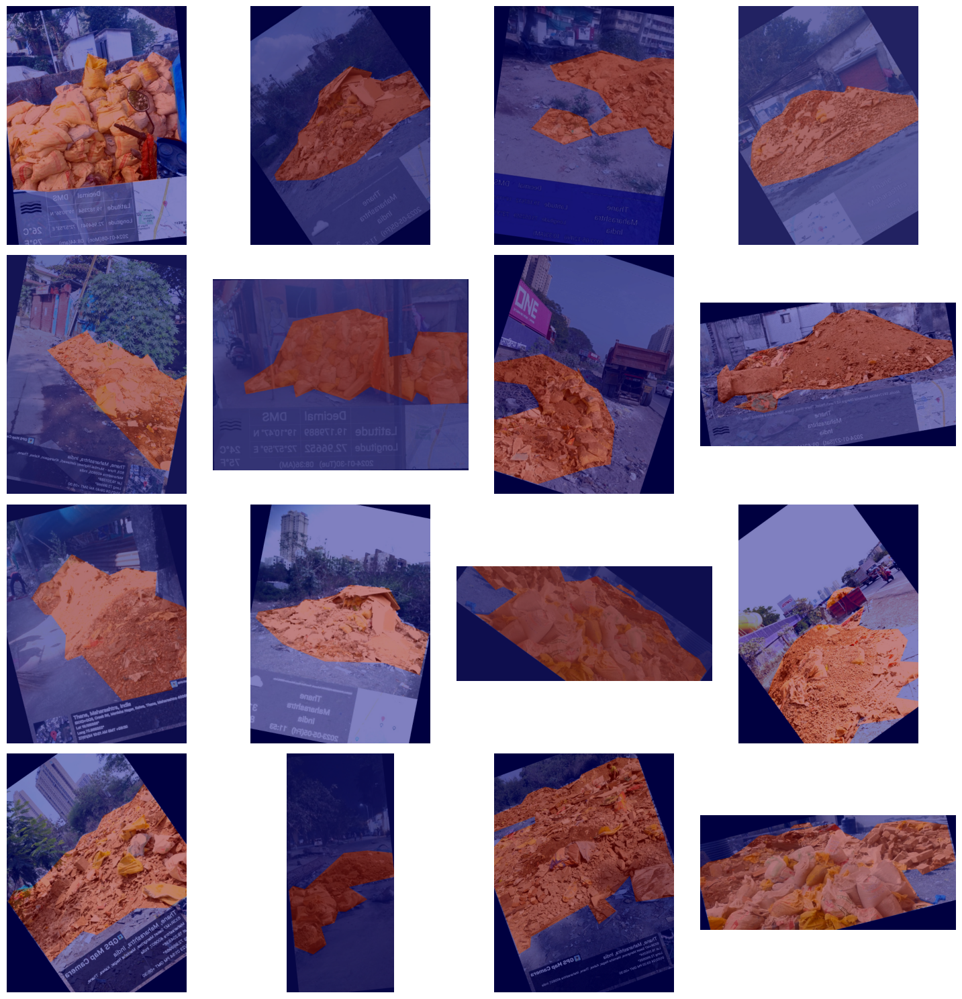

In [4]:
import os
import cv2
import random
import matplotlib.pyplot as plt

def overlay_mask_on_image(image, mask, alpha=0.5):
    """Overlay mask on the image with transparency."""
    color_mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(image, alpha, color_mask, 1 - alpha, 0)
    return overlayed_image

def display_images_in_grid(images, grid_size):
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(15, 15))
    
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            image = images[i]
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax.axis('off')  # Hide the axis
        else:
            ax.axis('off')  # Hide empty subplots

    plt.tight_layout()
    plt.show()

# Directories for images and masks
image_dir = 'augmented_train'
output_dir = 'augmented_masks'
mask_dir = output_dir  # Directory where masks were saved

# Accumulate overlayed images
overlayed_images = []

for filename in os.listdir(image_dir):
    img_path = os.path.join(image_dir, filename)
    mask_path = os.path.join(mask_dir, filename.replace('.jpg', '.png'))
    
    if os.path.exists(mask_path):
        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        overlayed_image = overlay_mask_on_image(image, mask)
        resized_image = cv2.resize(overlayed_image, (overlayed_image.shape[1] // 2, overlayed_image.shape[0] // 2))
        overlayed_images.append(resized_image)
        
        # Optionally save the overlayed image
        overlayed_image_path = os.path.join('path_to_save_overlayed_images', filename.replace('.jpg', '_overlayed.png'))
        os.makedirs('path_to_save_overlayed_images', exist_ok=True)
        cv2.imwrite(overlayed_image_path, overlayed_image)

    else:
        print("Error: Paths don't match")

# Randomly select 16 images
random.shuffle(overlayed_images)
selected_images = overlayed_images[:16]

# Display the images in a 4x4 grid
display_images_in_grid(selected_images, grid_size=(4, 4))


# Modified code for IMG Aug v2

In [28]:
import os
import cv2
import numpy as np
import imgaug.augmenters as iaa

# Function to load an image and its corresponding mask
def load_image_and_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return image, mask

# Function to save augmented images and masks
def save_augmented_images_and_masks(augmented_images, augmented_masks, image_save_dir, mask_save_dir, base_filename, start_index):
    for i, (aug_img, aug_mask) in enumerate(zip(augmented_images, augmented_masks)):
        aug_img_path = os.path.join(image_save_dir, f"{base_filename}_aug_{start_index + i}.jpg")
        aug_mask_path = os.path.join(mask_save_dir, f"{base_filename}_aug_{start_index + i}.png")
        cv2.imwrite(aug_img_path, aug_img)
        cv2.imwrite(aug_mask_path, aug_mask)

# Define augmentation sequence for images
def iamge_augs(hflip=0.5, rotate=[-25],crop,brightness,gblur):
    image_seq = iaa.Sequential([
        iaa.Fliplr(hflip),  # horizontal flips
        iaa.Affine(rotate=(-25, 25)),  # random rotations
        iaa.Crop(percent=(0, 0.3)),  # random crops
        iaa.Multiply((0.5, 1.5)),  # change brightness
        iaa.GaussianBlur(sigma=(0, 0.5))  # blur images
    ])
    return image_seq

# Define augmentation sequence for masks (excluding brightness and blur)
mask_seq = iaa.Sequential([
    iaa.Fliplr(0.5),  # horizontal flips
    iaa.Affine(rotate=(-25, 25)),  # random rotations
    iaa.Crop(percent=(0, 0.3))  # random crops
])

# Number of augmentations per image
num_augmentations = 20

# Paths
image_dir = 'train_images'
mask_dir = 'masks'
aug_image_save_dir = 'augmented_train'
aug_mask_save_dir = 'augmented_masks'
os.makedirs(aug_image_save_dir, exist_ok=True)
os.makedirs(aug_mask_save_dir, exist_ok=True)

# Perform augmentation
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        image_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))
        
        if os.path.exists(mask_path):
            image, mask = load_image_and_mask(image_path, mask_path)
            
            images = [image] * num_augmentations
            masks = [mask] * num_augmentations

            # Augment images and masks
            augmented_images = image_seq(images=images)
            augmented_masks = mask_seq(images=masks)
            
            # Save augmented images and masks
            base_filename = os.path.splitext(filename)[0]
            save_augmented_images_and_masks(augmented_images, augmented_masks, aug_image_save_dir, aug_mask_save_dir, base_filename, start_index=0)

        else:
            print(f"Mask not found for {filename}. Skipping...")


## display results

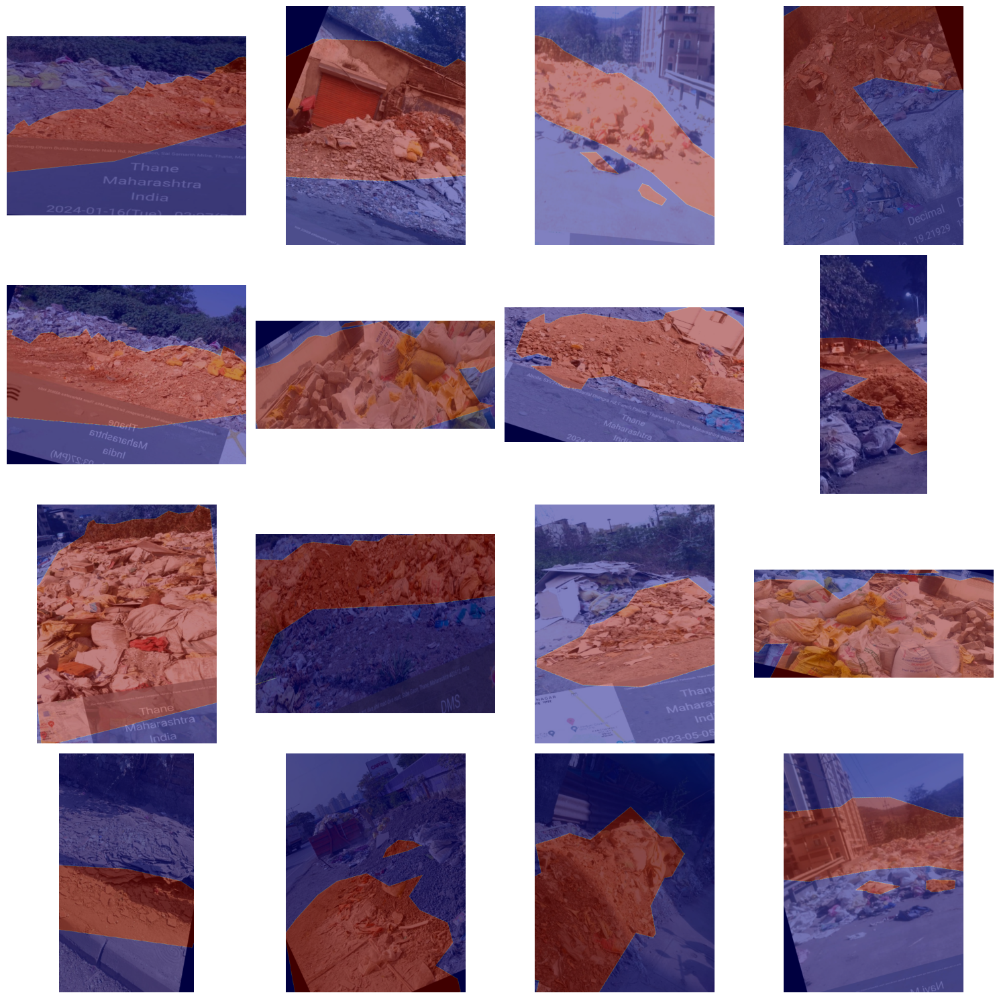

In [30]:
import os
import cv2
import random
import matplotlib.pyplot as plt

def overlay_mask_on_image(image, mask, alpha=0.5):
    """Overlay mask on the image with transparency."""
    color_mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET)
    overlayed_image = cv2.addWeighted(image, alpha, color_mask, 1 - alpha, 0)
    return overlayed_image

def display_images_in_grid(images, grid_size):
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(15, 15))
    
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            image = images[i]
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax.axis('off')  # Hide the axis
        else:
            ax.axis('off')  # Hide empty subplots

    plt.tight_layout()
    plt.show()

# Directories for images and masks
image_dir = 'augmented_train'
output_dir = 'augmented_masks'
mask_dir = output_dir  # Directory where masks were saved

# Accumulate overlayed images
overlayed_images = []

for filename in os.listdir(image_dir):
    img_path = os.path.join(image_dir, filename)
    # mask_path = os.path.join(mask_dir, filename.replace('.jpg', '_mask.png'))
    ######################################################### Temp fix
    mask_path = os.path.join(mask_dir, filename.replace('.jpg', '.png'))
    
    if os.path.exists(mask_path):
        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        overlayed_image = overlay_mask_on_image(image, mask)
        resized_image = cv2.resize(overlayed_image, (overlayed_image.shape[1] // 2, overlayed_image.shape[0] // 2))
        overlayed_images.append(resized_image)
        
        # Optionally save the overlayed image
        overlayed_image_path = os.path.join('path_to_save_overlayed_images', filename.replace('.jpg', '_overlayed.png'))
        os.makedirs('path_to_save_overlayed_images', exist_ok=True)
        cv2.imwrite(overlayed_image_path, overlayed_image)

    else:
        print("Error: Paths don't match")

# Randomly select 16 images
random.shuffle(overlayed_images)
selected_images = overlayed_images[:16]

# Display the images in a 4x4 grid
display_images_in_grid(selected_images, grid_size=(4, 4))
